# Imports and helper functions

## Packets

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.svm import SVC
from sklearn.preprocessing import RobustScaler
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import lime
import shap
import lime.lime_tabular

np.random.seed(42)

## Model Selection

In [2]:
def get_scores(y_test, y_pred, acc):
    labels = ["U", "P"]

    acc = round(acc, 2)

    print(classification_report(y_test, y_pred))

    #Confusion Matrix
    norms = [None, "true"]
    for norm in norms:
        cm = confusion_matrix(y_test, y_pred, normalize=norm)

        plt.figure(figsize=(7,7))
        
        if norm == "true":
            sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'BuPu', xticklabels = labels, yticklabels = labels)
        else:
            sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'BuPu', xticklabels = labels, yticklabels = labels)
        plt.ylabel('Actual label')
        plt.xlabel('Predicted label')
        all_sample_title = 'Accuracy Score: {0}'.format(acc)
        plt.title(all_sample_title, size = 15)


def svm(X_train, X_test, y_train, y_test):
    clf = SVC(kernel = "rbf", decision_function_shape = "ovo", probability=True)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    acc = clf.score(X_test, y_test)

    get_scores(y_test, y_pred, acc)
    return clf

def random_forest(X_train, X_test, y_train, y_test):
    rf = RandomForestClassifier(random_state=42)
    rf.fit(X_train, y_train)

    y_pred = rf.predict(X_test)
    acc = rf.score(X_test, y_test)

    get_scores(y_test, y_pred, acc)
    return rf

def mlp(X_train, X_test, y_train, y_test, iters=300):
    clf = MLPClassifier(random_state=42, max_iter=iters)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    acc = clf.score(X_test, y_test)

    get_scores(y_test, y_pred, acc)
    return clf, y_pred

## Explainability

In [79]:
def lime_explanation(model, X_test, X_train, y_train, features_names, i=0):
    explainer = lime.lime_tabular.LimeTabularExplainer(X_train,
                                                    mode='classification',
                                                    training_labels=y_train,
                                                    feature_names=features_names,
                                                    verbose=True)

    exp = explainer.explain_instance(X_test[i], model.predict_proba, num_features=len(features_names), top_labels=1)
    exp.show_in_notebook()

def shap_explanation(model, X_test, features_names, sample_indx = 0):
    # ['degree', 'ring', 'NetRank', 'NetShort', 'HeatDiff', 'InfoDiff']
    # 100 samples from training set
    x100 = shap.utils.sample(X_test, 100)

    # for fn in features_names:
    #     shap.plots.partial_dependence(
    #         fn, model, x100, ice=False,
    #         model_expected_value=True, feature_expected_value=True,
    #         feature_names=features_names
    #     )
    
    # Compute the shap values
    explainer = shap.Explainer(model, x100, feature_names=features_names)
    shap_values = explainer(X_test)

    for fn in features_names:
        shap.partial_dependence_plot(
            fn, model, x100, model_expected_value=True,
            feature_expected_value=True, ice=False,
            shap_values=shap_values[sample_indx:sample_indx+1,:],
            feature_names=features_names
        )
    
    shap.plots.waterfall(shap_values[sample_indx], max_display=14)
    print("--- Beeswarm ---")
    shap.plots.beeswarm(shap_values, max_display=14)

    shap.initjs()
    shap.plots.force(shap_values[sample_indx])

    shap.initjs()
    shap.plots.force(shap_values[:1000])

    shap.plots.scatter(shap_values, ylabel="SHAP\n")

# Malignant neoplasm of breast

### Data

In [26]:
nedbit_features = pd.read_csv('Datasets/C0006142_features.csv')
nedbit_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19761 entries, 0 to 19760
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      19761 non-null  object 
 1   class     19761 non-null  int64  
 2   degree    19761 non-null  int64  
 3   ring      19761 non-null  int64  
 4   NetRank   19761 non-null  float64
 5   NetShort  19761 non-null  float64
 6   HeatDiff  19761 non-null  float64
 7   InfoDiff  19761 non-null  float64
dtypes: float64(4), int64(3), object(1)
memory usage: 1.2+ MB


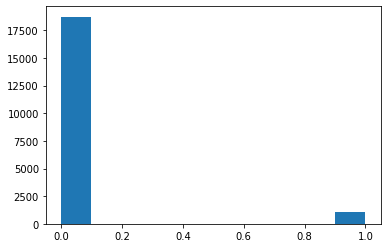

In [28]:
geneNames = nedbit_features.pop("name").values

yData = nedbit_features.pop("class").values
plt.hist(yData)
plt.show()

In [29]:
features_names = nedbit_features.columns.to_list()
features_names

['degree', 'ring', 'NetRank', 'NetShort', 'HeatDiff', 'InfoDiff']

In [30]:
xData = nedbit_features.values

transformer = RobustScaler().fit(xData)
xData = transformer.transform(xData)

In [31]:
train_ratio = 0.70
X_train, X_test, y_train, y_test = train_test_split(xData, yData, test_size= 1 - train_ratio, random_state = 42, shuffle = True, stratify = yData)

### SVM

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      1.00      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



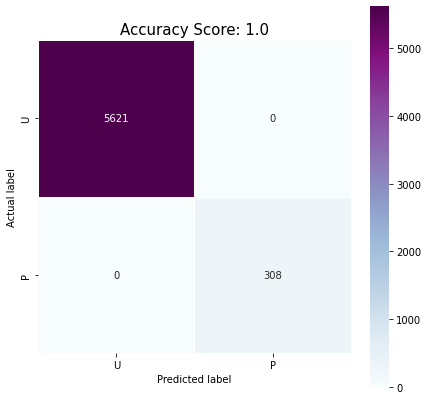

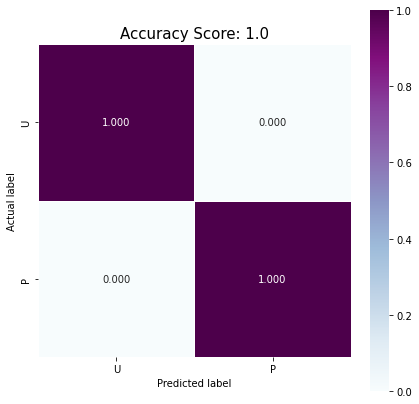

In [10]:
svm_model = svm(X_train, X_test, y_train, y_test)

In [11]:
lime_explanation(svm_model, X_train, X_test, y_train, features_names, 5)

Intercept -0.010348769057692483
Prediction_local [0.16703822]
Right: 0.9999933132048965


Exact explainer: 5930it [02:31, 37.04it/s]                          


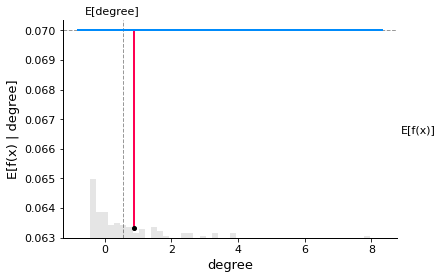

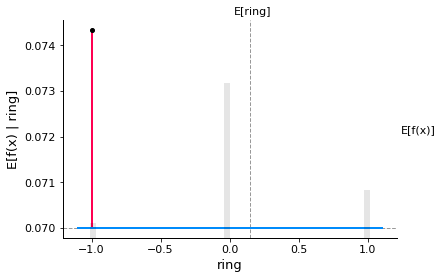

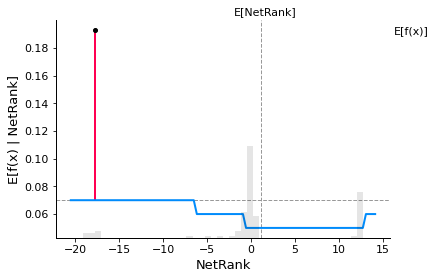

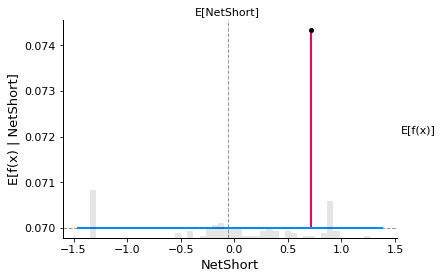

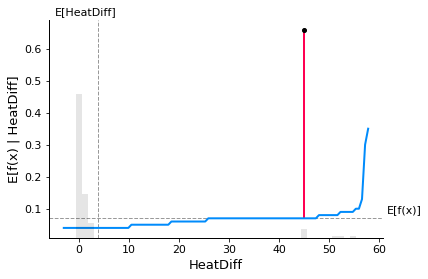

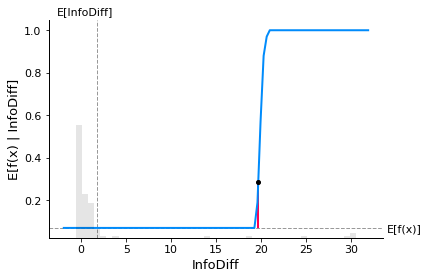

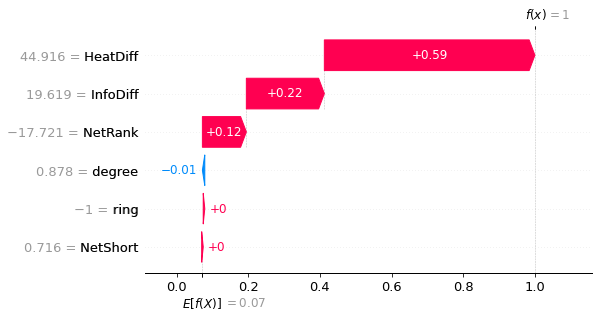

--- Beeswarm ---


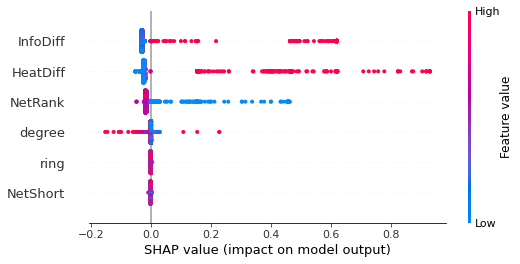

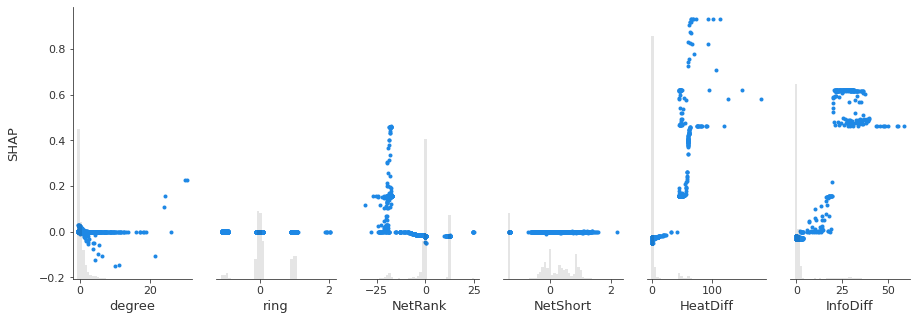

In [12]:
shap_explanation(svm_model.predict, X_test, features_names, sample_indx=5)

### Random Forest

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      1.00      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



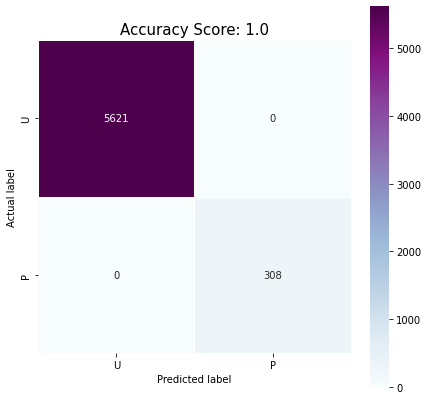

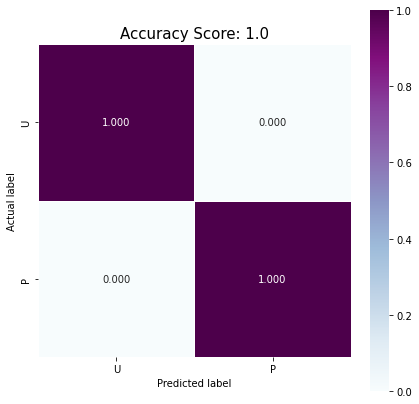

In [13]:
rf_model = random_forest(X_train, X_test, y_train, y_test)

In [14]:
lime_explanation(rf_model, X_train, X_test, y_train, features_names, 5)

Intercept -0.0023593424889832987
Prediction_local [0.1630883]
Right: 1.0


Exact explainer: 5930it [03:06, 30.08it/s]                          


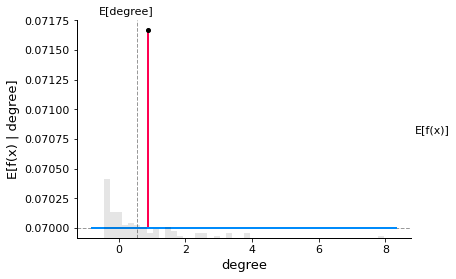

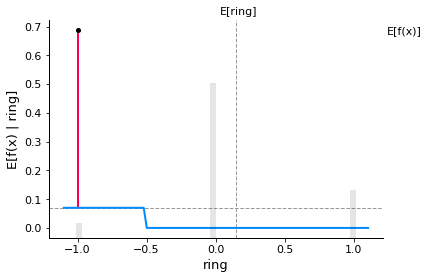

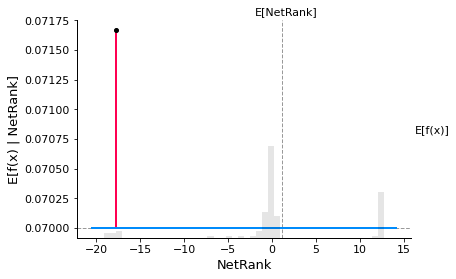

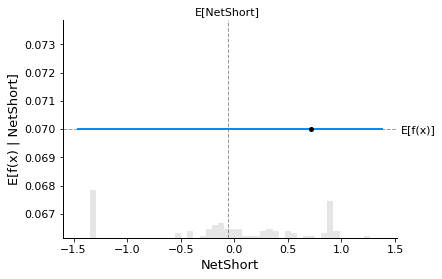

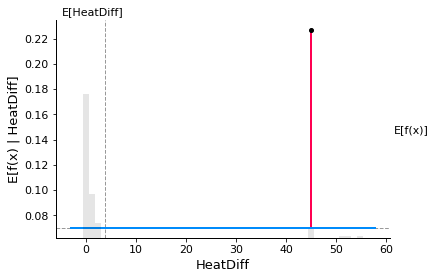

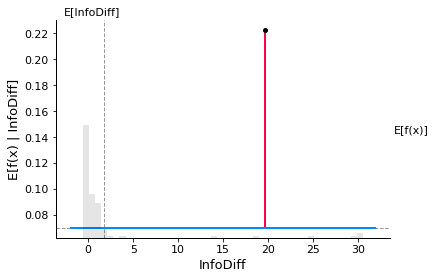

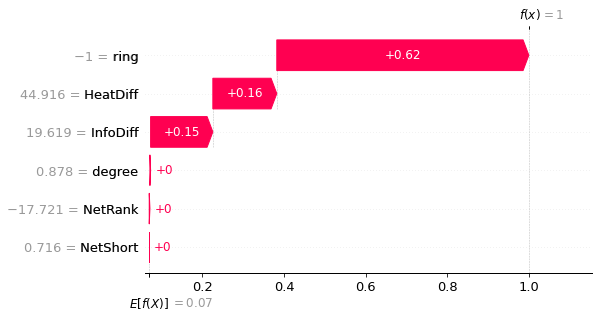

--- Beeswarm ---


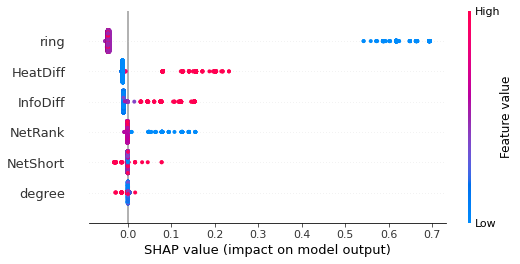

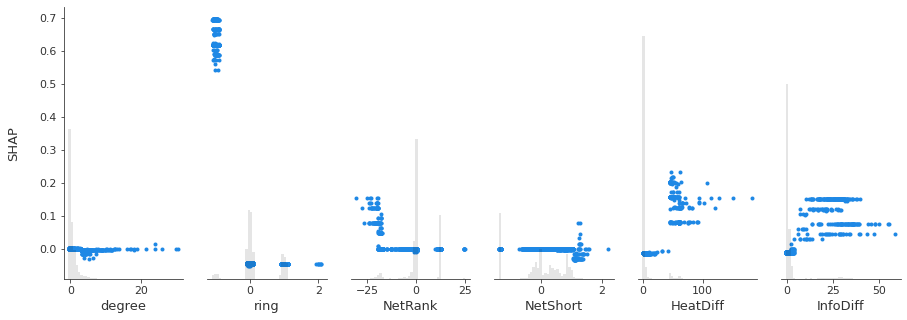

In [15]:
shap_explanation(rf_model.predict, X_test, features_names, sample_indx=5)

### MLP

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      0.99      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



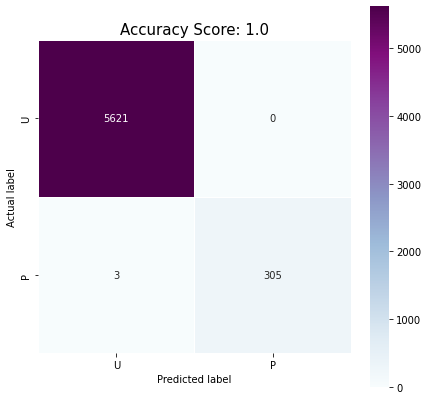

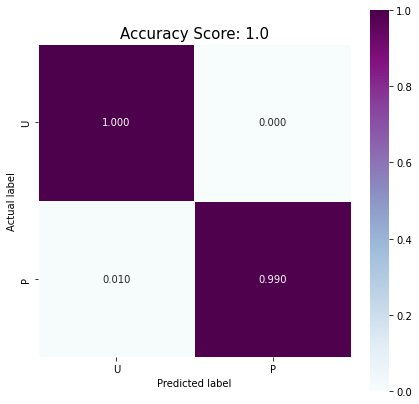

In [16]:
mlp_model, y_pred = mlp(X_train, X_test, y_train, y_test)

In [17]:
lime_explanation(mlp_model, X_train, X_test, y_train, features_names, 5)

Intercept -0.04960652973619277
Prediction_local [0.19130348]
Right: 0.9999124439682101


Exact explainer: 5930it [00:29, 131.77it/s]                          


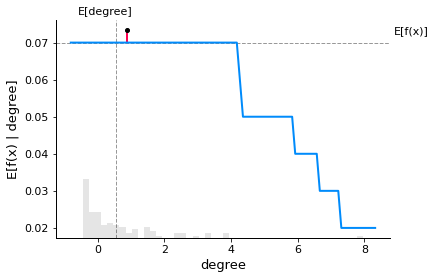

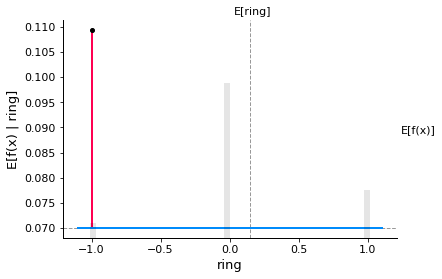

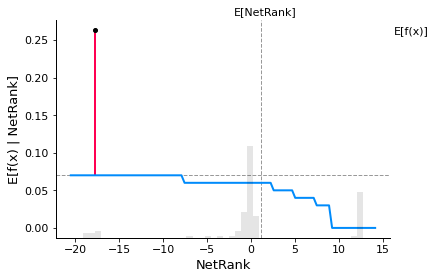

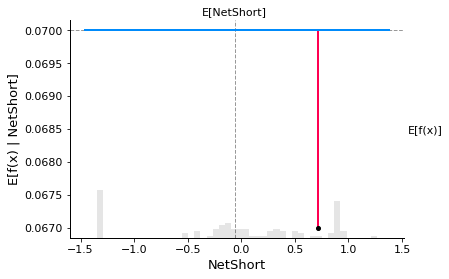

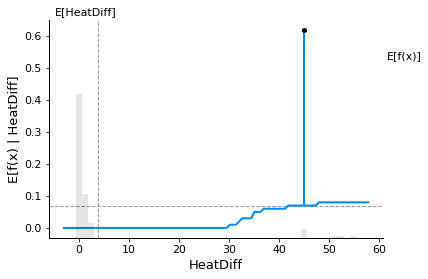

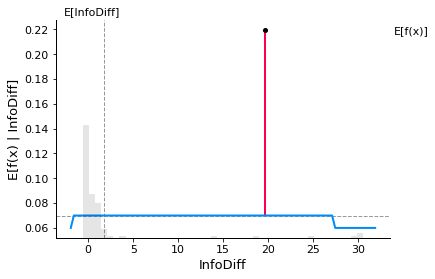

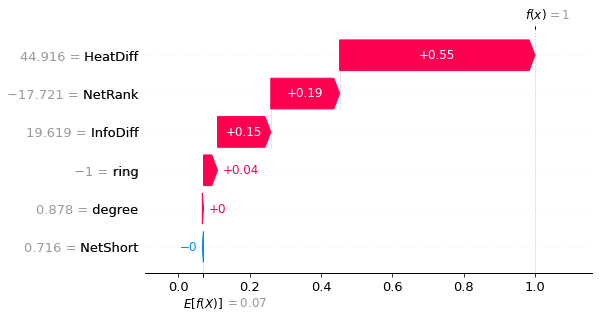

--- Beeswarm ---


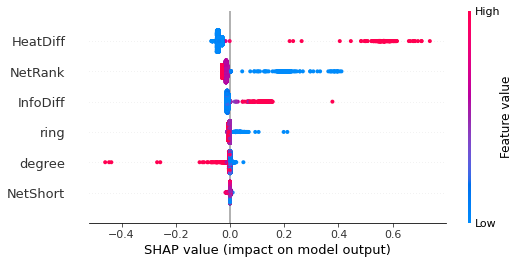

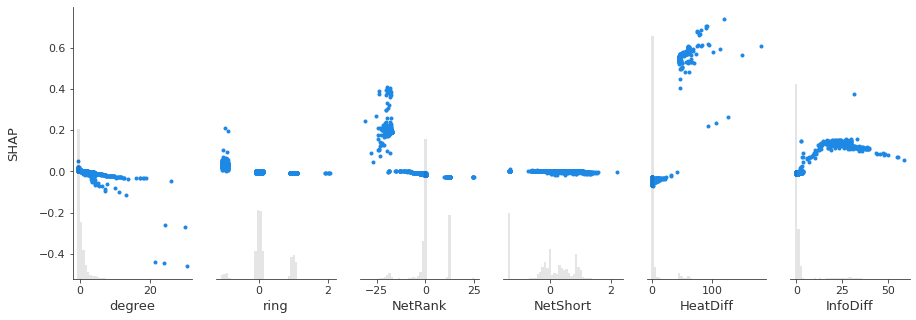

In [18]:
shap_explanation(mlp_model.predict, X_test, features_names, sample_indx=5)

## Dimensionality Reduction

Features to remove from explanation results:
- SVM: degree, ring, NetShort
- Random Forest: degree, NetRank, NetShort
- MLP: degree, ring, NetShort

### SVM

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      1.00      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



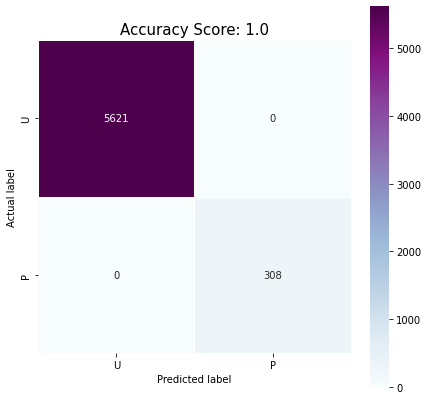

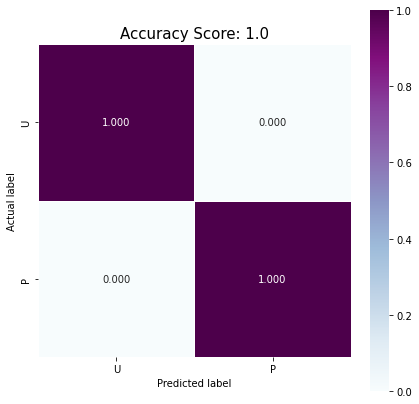

In [37]:
train_ratio = 0.70

nedbit_features_svm_dr  = nedbit_features.drop(columns=['degree', 'ring', 'NetShort'])

xData = nedbit_features_svm_dr.values

transformer = RobustScaler().fit(xData)
xData = transformer.transform(xData)

X_train, X_test, y_train, y_test = train_test_split(xData, yData, test_size= 1 - train_ratio, random_state = 42, shuffle = True, stratify = yData)
svm_model = svm(X_train, X_test, y_train, y_test)

### Random Forest

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      1.00      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



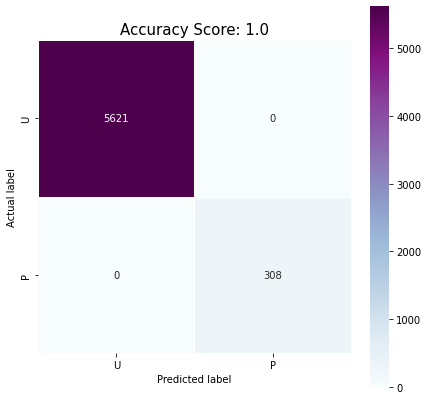

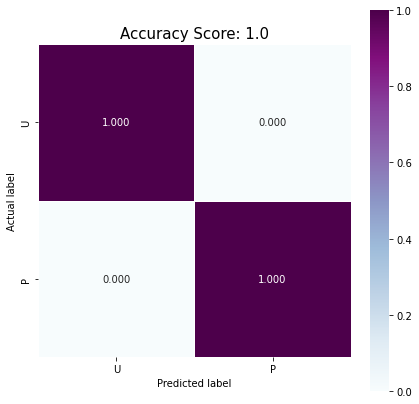

In [41]:
train_ratio = 0.70

nedbit_features_rf_dr  = nedbit_features.drop(columns=['degree', 'NetRank', 'NetShort'])

xData = nedbit_features_rf_dr.values

transformer = RobustScaler().fit(xData)
xData = transformer.transform(xData)

X_train, X_test, y_train, y_test = train_test_split(xData, yData, test_size= 1 - train_ratio, random_state = 42, shuffle = True, stratify = yData)
rf_model = random_forest(X_train, X_test, y_train, y_test)

### MLP

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5621
           1       1.00      1.00      1.00       308

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



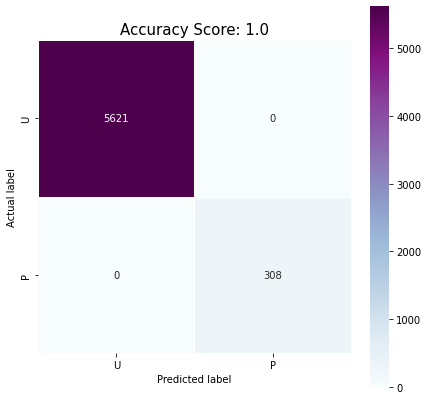

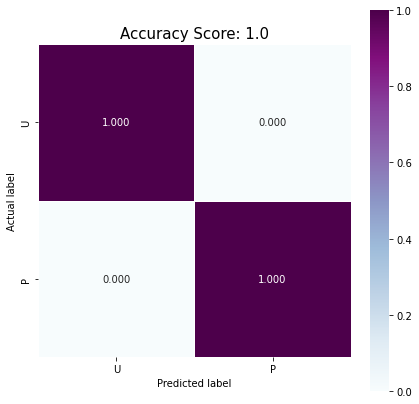

In [39]:
train_ratio = 0.70

nedbit_features_mlp_dr  = nedbit_features.drop(columns=['degree', 'ring', 'NetShort'])

xData = nedbit_features_mlp_dr.values

transformer = RobustScaler().fit(xData)
xData = transformer.transform(xData)

X_train, X_test, y_train, y_test = train_test_split(xData, yData, test_size= 1 - train_ratio, random_state = 42, shuffle = True, stratify = yData)
mlp_model = mlp(X_train, X_test, y_train, y_test)

# Schizophrenia

### Data

In [44]:
nedbit_features = pd.read_csv('Datasets/C0036341_features.csv')
geneNames = nedbit_features.pop("name").values

yData = nedbit_features.pop("class").values
xData = nedbit_features.values

transformer = RobustScaler().fit(xData)
xData = transformer.transform(xData)

train_ratio = 0.70
X_train, X_test, y_train, y_test = train_test_split(xData, yData, test_size= 1 - train_ratio, random_state = 42, shuffle = True, stratify = yData)


### SVM

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5679
           1       1.00      1.00      1.00       250

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



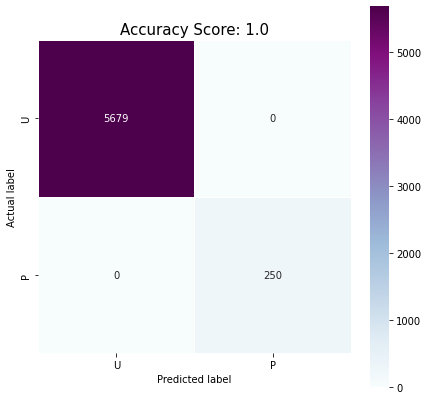

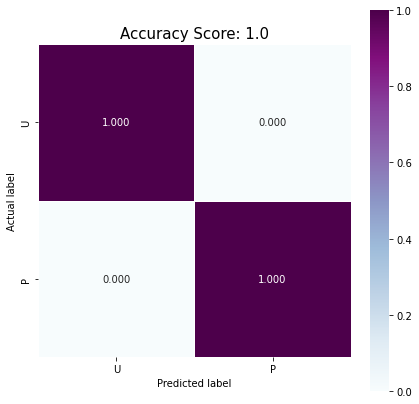

In [74]:
svm_model = svm(X_train, X_test, y_train, y_test)

In [80]:
lime_explanation(svm_model, X_train, X_test, y_train, features_names, 34)

Intercept -0.00214319737804132
Prediction_local [0.30952497]
Right: 0.995412600246577


Exact explainer: 5930it [02:16, 40.24it/s]                          


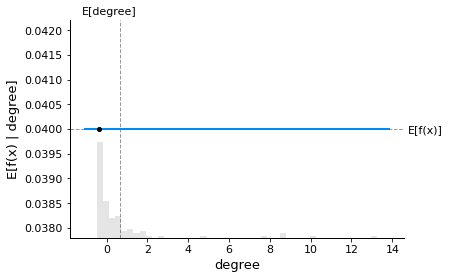

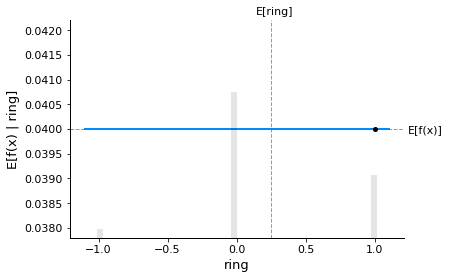

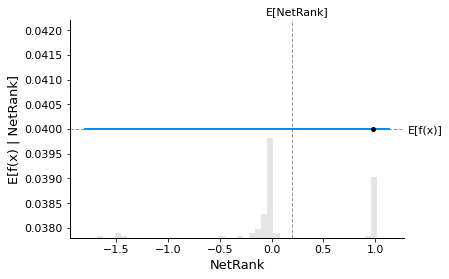

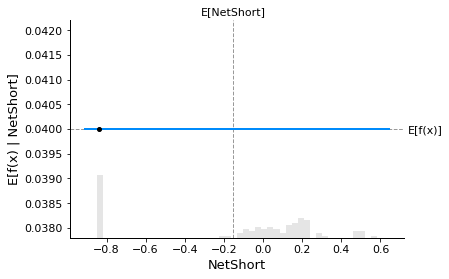

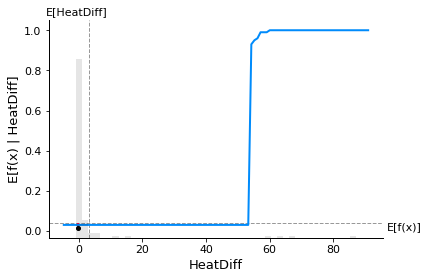

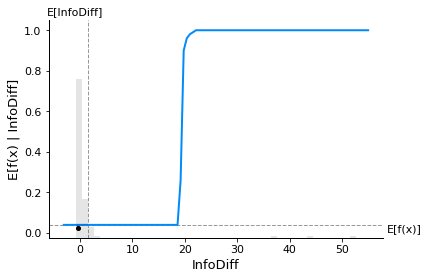

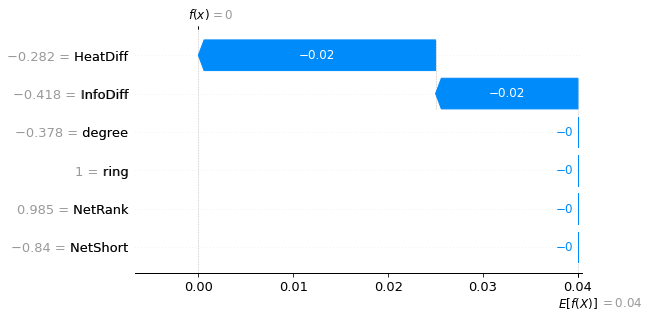

--- Beeswarm ---


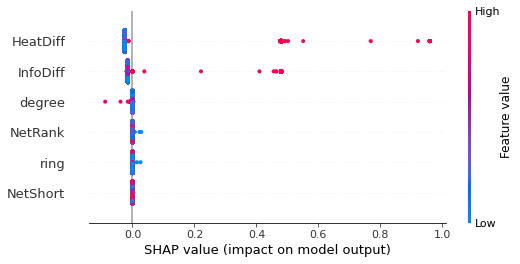

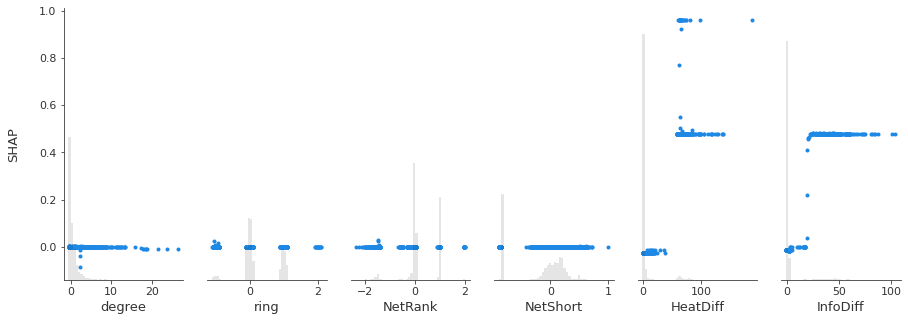

In [81]:
shap_explanation(svm_model.predict, X_test, features_names, sample_indx=34)

### Random Forest

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5679
           1       1.00      1.00      1.00       250

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



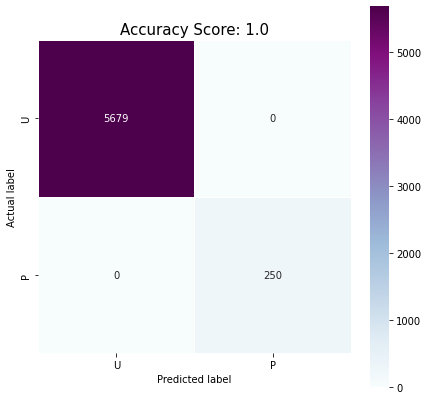

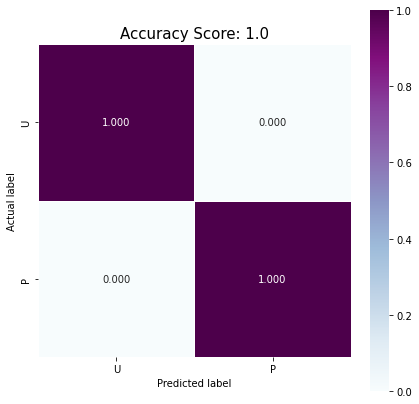

In [82]:
rf_model = random_forest(X_train, X_test, y_train, y_test)

In [83]:
lime_explanation(rf_model, X_train, X_test, y_train, features_names, 34)

Intercept -0.0014383239263072306
Prediction_local [0.15095175]
Right: 1.0


In [ ]:
shap_explanation(rf_model.predict, X_test, features_names, sample_indx=34)

### MLP

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5679
           1       1.00      1.00      1.00       250

    accuracy                           1.00      5929
   macro avg       1.00      1.00      1.00      5929
weighted avg       1.00      1.00      1.00      5929



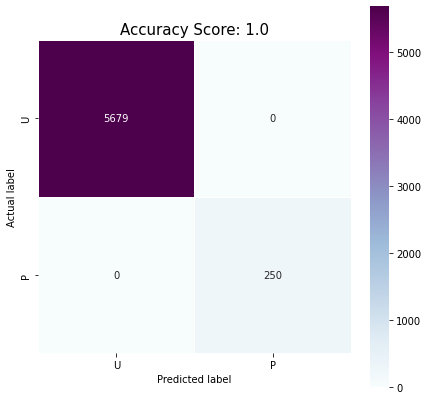

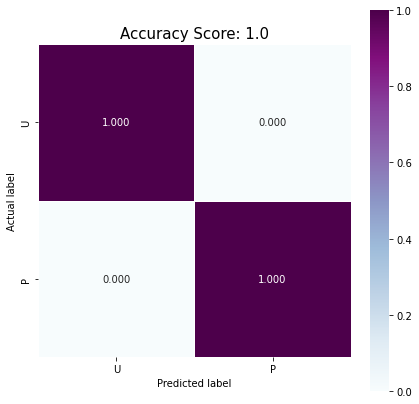

In [90]:
mlp_model, pred = mlp(X_train, X_test, y_train, y_test)

In [91]:
lime_explanation(mlp_model, X_train, X_test, y_train, features_names, 34)

Intercept -0.039298806469343785
Prediction_local [0.15508496]
Right: 0.999999380145271


Exact explainer: 5930it [00:28, 129.37it/s]                          


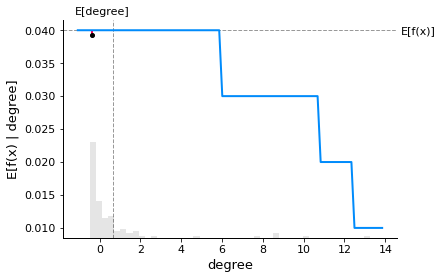

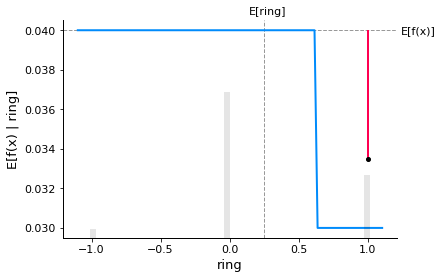

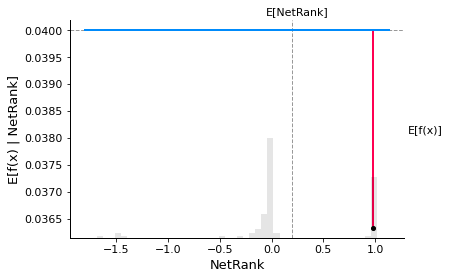

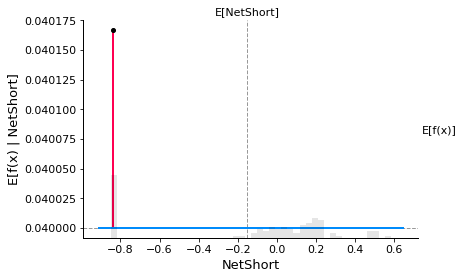

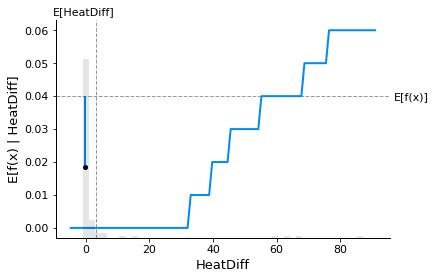

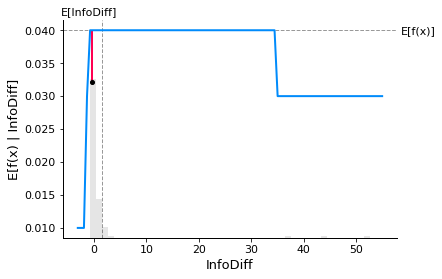

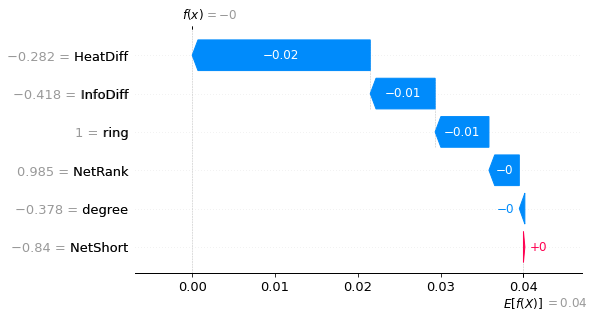

--- Beeswarm ---


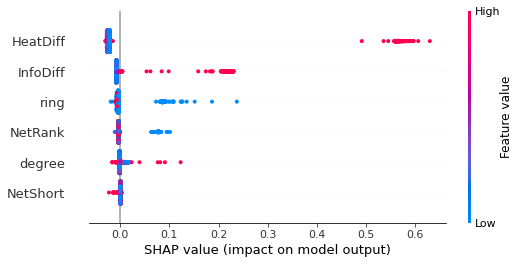

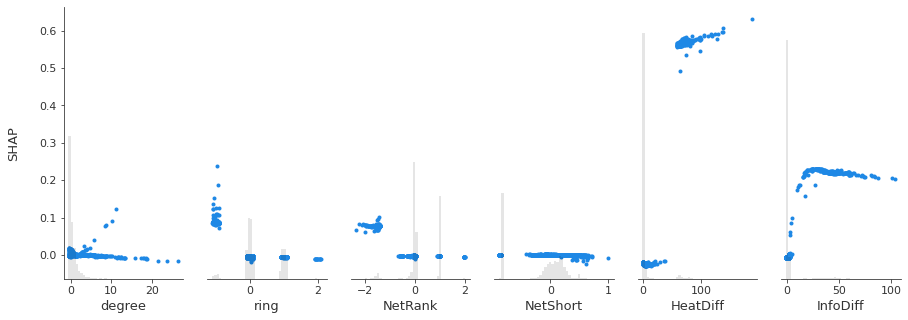

In [92]:
shap_explanation(mlp_model.predict, X_test, features_names, sample_indx=34)